<a href="https://colab.research.google.com/github/gamv12/Proyecto-Coderhouse/blob/main/SegundaEntrega%2BMesber.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Abstract

**Definición del objetivo:** El propósito de este proyecto es desarrollar un modelo de aprendizaje automático que pueda clasificar el puntaje crediticio de una persona utilizando información relacionada con su historial crediticio. El puntaje crediticio se categorizará en tres valores: "Poor" cuando el crédito es deficiente, "Good" cuando es excelente y "Standard" cuando se encuentra en un nivel intermedio. Además, se busca identificar los diversos factores que influyen positiva o negativamente en el puntaje crediticio de un individuo.

**Motivacion:** Radica en la importancia del puntaje crediticio en la vida financiera de las personas. Un puntaje crediticio saludable puede facilitar la obtención de préstamos, tarjetas de crédito y tasas de interés favorables, mientras que un puntaje bajo puede limitar las oportunidades financieras.

**Contexto comercial:** En el ámbito comercial, las instituciones financieras, como bancos y emisores de tarjetas de crédito, confían en gran medida en la evaluación precisa del riesgo crediticio de los solicitantes para tomar decisiones fundamentadas sobre préstamos y líneas de crédito.

**Problemas Comerciales:** Uno de los desafíos más importantes es desarrollar modelos de puntaje crediticio que sean precisos en la evaluación del riesgo crediticio. Las evaluaciones incorrectas pueden llevar a otorgar créditos a personas que no pueden pagarlos o, por el contrario, negar créditos a personas que son financieramente responsables. Otro problema seria la falta de información precisa sobre la historia crediticia de un individuo o su situación financiera actual puede dificultar la toma de decisiones precisas.

**Contexto Analitico:** Para abordar el objetivo del proyecto, contamos con una amplia base de datos que contiene información detallada sobre los solicitantes de crédito. Esto incluye datos históricos de crédito, información financiera actual, historial de pagos, ingresos, empleo y más.

**Audiencia:** Incluye instituciones financieras, solicitantes de crédito, reguladores gubernamentales, analistas de riesgo y datos, consumidores y defensores del consumidor, así como profesionales de cumplimiento normativo y ejecutivos de instituciones financieras. Cada grupo tiene intereses y necesidades específicas relacionadas con la evaluación y el uso de los puntajes crediticios, lo que destaca la importancia de comunicar los resultados de manera efectiva y clara para satisfacer sus expectativas y requisitos.



##EDA

In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"





In [26]:
credit_score = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vShxKWOQX1823TRXlkiCegGpFwQddIRu_j5zkAbJJ8nAeI148m5N9eRExS3etld6oU3YFLOhv8pK1m6/pub?gid=2144254156&single=true&output=csv')
credit_score.head(5)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,18.248.433.333.333.300,3,...,_,809.98,26.822.619.623.699.000,22 Years and 1 Months,No,4.957.494.921.489.410,8.041.529.543.900.250,High_spent_Small_value_payments,31.249.408.867.943.600,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,3.194.496.005.538.420,NaN,No,4.957.494.921.489.410,11.828.022.162.236.700,Low_spent_Large_value_payments,28.462.916.249.607.100,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,2.860.935.202.206.990,22 Years and 3 Months,No,4.957.494.921.489.410,81.699.521.264.648,Low_spent_Medium_value_payments,3.312.098.628.537.910,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377.861.869.582.300,22 Years and 4 Months,No,4.957.494.921.489.410,1.994.580.743.910.710,Low_spent_Small_value_payments,22.345.130.972.736.700,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,18.248.433.333.333.300,3,...,Good,809.98,24.797.346.908.844.900,22 Years and 5 Months,No,4.957.494.921.489.410,41.420.153.086.217.300,High_spent_Medium_value_payments,34.148.923.103.222.100,Good


In [27]:
credit_score.shape

(100000, 28)

In [28]:
credit_score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   object 
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [29]:
credit_score.describe()

,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries
count,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000
mean,17.091280,22.47443,72.466040,21.068780,27.754251
std,117.404834,129.05741,466.422621,14.860104,193.177339
min,-1.000000,0.00000,1.000000,-5.000000,0.000000
25%,3.000000,4.00000,8.000000,10.000000,3.000000
50%,6.000000,5.00000,13.000000,18.000000,6.000000
75%,7.000000,7.00000,20.000000,28.000000,9.000000
max,1798.000000,1499.00000,5797.000000,67.000000,2597.000000


ID = Representa una identificación única de una entrada

Customer_ID = Representa una identificación única de una persona

Month = Representa el mes del año

Name = Representa el nombre de una persona

Age = Representa la edad de la persona

SSN = Representa el número de seguro social de una persona

Occupation = Representa la ocupación de la persona

Annual_Income = Representa el ingreso anual de la persona

Monthly_Inhand_Salary = Representa el salario base mensual de una persona

Num_Bank_Accounts = Representa el número de cuentas bancarias que una persona tiene

Num_Credit_Card = Representa el número de otras tarjetas de crédito que posee una persona

Interest_Rate = Representa la tasa de interés de la tarjeta de crédito

Num_of_Loan = Representa el número de préstamos tomados del banco

Type_of_Loan = Representa los tipos de préstamos tomados por una persona

Delay_from_due_date = Representa el número promedio de días de retraso desde la fecha de pago

Num_of_Delayed_Payment = Representa el número promedio de pagos retrasados por una persona

Changed_Credit_Limit = Representa el cambio porcentual en el límite de la tarjeta de crédito

Num_Credit_Inquiries = Representa el número de consultas de tarjeta de crédito

Credit_Mix = Representa la clasificación de la mezcla de créditos

Outstanding_Debt = Representa la deuda pendiente que se debe pagar (en USD)

Credit_Utilization_Ratio = Representa la relación de utilización de crédito de la tarjeta de crédito

Credit_History_Age = Representa la antigüedad del historial de crédito de la persona

Payment_of_Min_Amount = Representa si la persona pagó solo el monto mínimo

Total_EMI_per_month = Representa los pagos mensuales de EMI (en USD)

Amount_invested_monthly = Representa el monto mensual invertido por el cliente (en USD)

Payment_Behaviour = Representa el comportamiento de pago del cliente (en USD)

Monthly_Balance = Representa el monto de saldo mensual del cliente (en USD) )

###Buscamos los datos atipicos por columna, para ello vamos a buscar los datos unicos de cada columna.

In [30]:
columnas = credit_score.select_dtypes(include=['object']).columns
print(columnas)


Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_of_Loan', 'Type_of_Loan',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')


In [31]:
for col in columnas:
    print('Columna: '+col)
    print("__"*20)
    print(credit_score[col].value_counts(dropna=False))
    print('Final', "__"*18, '\n')

Columna: ID
________________________________________
0x1602     1
0x19c88    1
0x19caa    1
0x19ca5    1
0x19ca4    1
          ..
0xd94d     1
0xd94c     1
0xd94b     1
0xd94a     1
0x25fed    1
Name: ID, Length: 100000, dtype: int64
Final ____________________________________ 

Columna: Customer_ID
________________________________________
CUS_0xd40     8
CUS_0x9bf4    8
CUS_0x5ae3    8
CUS_0xbe9a    8
CUS_0x4874    8
             ..
CUS_0x2eb4    8
CUS_0x7863    8
CUS_0x9d89    8
CUS_0xc045    8
CUS_0x942c    8
Name: Customer_ID, Length: 12500, dtype: int64
Final ____________________________________ 

Columna: Month
________________________________________
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: Month, dtype: int64
Final ____________________________________ 

Columna: Name
________________________________________
NaN                 9985
Langep                44
Stevex        

In [32]:
def text_cleaning(data):
    if data is np.NaN or not isinstance(data, str):
        return data
    else:
        return str(data).strip('_ ,"')

In [33]:
df = credit_score.applymap(text_cleaning).replace(['', 'nan', '!@9#%8', '#F%$D@*&8'], np.NaN)
df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,18.248.433.333.333.300,3,...,NaN,809.98,26.822.619.623.699.000,22 Years and 1 Months,No,4.957.494.921.489.410,8.041.529.543.900.250,High_spent_Small_value_payments,31.249.408.867.943.600,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,3.194.496.005.538.420,NaN,No,4.957.494.921.489.410,11.828.022.162.236.700,Low_spent_Large_value_payments,28.462.916.249.607.100,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,2.860.935.202.206.990,22 Years and 3 Months,No,4.957.494.921.489.410,81.699.521.264.648,Low_spent_Medium_value_payments,3.312.098.628.537.910,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377.861.869.582.300,22 Years and 4 Months,No,4.957.494.921.489.410,1.994.580.743.910.710,Low_spent_Small_value_payments,22.345.130.972.736.700,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,18.248.433.333.333.300,3,...,Good,809.98,24.797.346.908.844.900,22 Years and 5 Months,No,4.957.494.921.489.410,41.420.153.086.217.300,High_spent_Medium_value_payments,34.148.923.103.222.100,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3.359.415.833.333.330,4,...,NaN,502.38,3.466.357.180.929.320,31 Years and 6 Months,No,3.510.402.261.040.740,6.097.133.255.718.480,High_spent_Large_value_payments,47.986.622.816.574.000,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3.359.415.833.333.330,4,...,NaN,502.38,40.565.630.963.889.200,31 Years and 7 Months,No,3.510.402.261.040.740,5.418.595.028.760.380,High_spent_Medium_value_payments,496.651.610.435.322,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3.359.415.833.333.330,4,...,Good,502.38,41.255.522.259.019.100,31 Years and 8 Months,No,3.510.402.261.040.740,2.402.847.744.864.440,High_spent_Large_value_payments,5.168.090.832.742.810,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3.359.415.833.333.330,4,...,Good,502.38,3.363.820.798.055.960,31 Years and 9 Months,No,3.510.402.261.040.740,25.167.258.219.721.600,Low_spent_Large_value_payments,3.191.649.785.257.090,Standard


###Corregimos el tipo de dato de algunas columnas para un mejor uso


In [34]:
df['ID']                      = df.ID.apply(lambda x: int(x, 16))
df['Customer_ID']             = df.Customer_ID.apply(lambda x: int(x[4:], 16))
df['Month']                   = pd.to_datetime(df.Month, format='%B').dt.month
df['Age']                     = df.Age.astype(int)
df['SSN']                     = df.SSN.apply(lambda x: x if x is np.NaN else int(str(x).replace('-', ''))).astype(float)
df['Annual_Income'] = df['Annual_Income'].str.replace('.', '').str.replace(',', '').astype(float)
df['Monthly_Inhand_Salary'] = df['Monthly_Inhand_Salary'].str.replace('[,.]', '', regex=True).astype(float)/ 1e13
df['Num_of_Loan']             = df.Num_of_Loan.astype(int)
df['Num_of_Delayed_Payment']  = df.Num_of_Delayed_Payment.astype(float)
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].str.replace('.', '').str.replace(',', '').astype(float)
df['Outstanding_Debt']        = df.Outstanding_Debt.astype(float)
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].str.replace('.', '').str.replace(',', '').astype(float)
df['Monthly_Balance'] = df['Monthly_Balance'].str.replace('.', '').str.replace(',', '').astype(float)



<ipython-input-34-003ca0defe10>:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['Annual_Income'] = df['Annual_Income'].str.replace('.', '').str.replace(',', '').astype(float)
<ipython-input-34-003ca0defe10>:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].str.replace('.', '').str.replace(',', '').astype(float)
<ipython-input-34-003ca0defe10>:12: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['Amount_invested_monthly'] = df['Amount_invested_monthly'].str.repla

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  int64  
 5   SSN                       94428 non-null   float64
 6   Occupation                92938 non-null   object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  int64  
 13  Type_of_Loan              88592 non-null   ob

### Buscamos la cantidad de datos faltantes por columnas


In [36]:
# Creamos una copia de nuestros datos por buena practica, ya que vamos a modificar.
df_copy2 = df.copy()
df_copy2.shape

(100000, 28)

In [37]:
df_copy2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  int64  
 5   SSN                       94428 non-null   float64
 6   Occupation                92938 non-null   object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  int64  
 13  Type_of_Loan              88592 non-null   ob

In [38]:
 #Busco los valores nulos de mi DataFrame
df.isna().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                          5572
Occupation                   7062
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour            7600
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

Sustituiré los valores actuales por sus correspondientes predecesores. Tras analizar detenidamente mi conjunto de datos, he constatado que los valores nulos en estas columnas no variarán si los reemplazamos por sus predecesores, dado que se refieren a la misma persona. Por lo tanto, los campos de salario mensual, puntaje crediticio y antigüedad en el historial crediticio pueden ser reemplazados por sus valores previos.






In [39]:
columnas_iguales = ["Monthly_Inhand_Salary", "Credit_Mix","Credit_History_Age"]
df[columnas_iguales] = df[columnas_iguales].fillna(method='ffill')



Las siguientes columnas la vamos a reemplazar por el valor "Desconocido" ya que estos datos podrían resultar útiles en futuros análisis.

In [40]:
df['Occupation'].fillna('Desconocido', inplace=True)
df['Type_of_Loan'].fillna('Desconocido', inplace=True)
df['Payment_Behaviour'].fillna('Desconocido', inplace=True)

Reemplazaremos los valores faltantes en las siguientes columnas por la mediana, ya que estos datos están distribuidos de manera aleatoria y utilizar la mediana nos permitirá mantener la distribución general de los datos sin distorsionarla.

In [41]:
median_credit_limit = df['Changed_Credit_Limit'].median()
df['Changed_Credit_Limit'].fillna(median_credit_limit, inplace=True)

median_delayed_payment = df['Num_of_Delayed_Payment'].median()
df['Num_of_Delayed_Payment'].fillna(median_delayed_payment, inplace=True)


Reemplazaremos los valores nulos en las siguientes columnas por el valor 0, considerando que la ausencia de datos implica que no hubo inversiones, consultas en la tarjeta de crédito ni cambios en el balance mensual durante ese mes.

In [42]:
df['Num_Credit_Inquiries'].fillna(0, inplace=True)
df['Amount_invested_monthly'].fillna(0, inplace=True)
df['Monthly_Balance'].fillna(0, inplace=True)

In [43]:
df.isna().sum()

ID                             0
Customer_ID                    0
Month                          0
Name                        9985
Age                            0
SSN                         5572
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     1
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly        0
Payment_Behaviour              0
Monthly_Balance                0
Credit_Score                   0
dtype: int64

Dejaré sin cambios los datos nulos restantes, ya que no tienen un impacto significativo en mi análisis general ni en la creación del modelo.

In [44]:
#Verificamos si hay datos duplicados
df.duplicated().sum()

0

## Analisis de Graficos

### Preguntas

**Pregunta principal**

¿Cuales son los distintos factores que afectan el historial
crediticio de un individuo?

**Preguntas secundarias (nos ayudara a contestar las principal)**

**1)**¿Cuál es la distribución de edades de los clientes en el conjunto de datos?

**2)**¿Qué ocupaciones son las más comunes entre los clientes?

**3)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y la cantidad de cuentas bancarias (Num_Bank_Accounts)?

**4)**¿Cuál es el comportamiento de pago (Payment_Behaviour) más común entre los clientes?

**5)**¿Existe alguna correlación entre el puntaje de crédito (Credit_Score) y el saldo mensual (Monthly_Balance)?

**6)**¿Cuántos clientes tienen retrasos en sus pagos (Num_of_Delayed_Payment)?

**7)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y la cantidad de prestamos solicitados a la vez?

**8)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Numero de Dias de Pago Retrasados de la Tarjeta de Credito?

**9)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Numero de Tarjetas de Credito?

**10)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Ingreso Mensual?

**11)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Average de las Tasas de Interes?

**12)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y en lo Invertido Mensual?

**13)**¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y en si la persona solo pago el minimo de la tarjeta?

###¿Cuál es la distribución de edades de los clientes en el conjunto de datos?

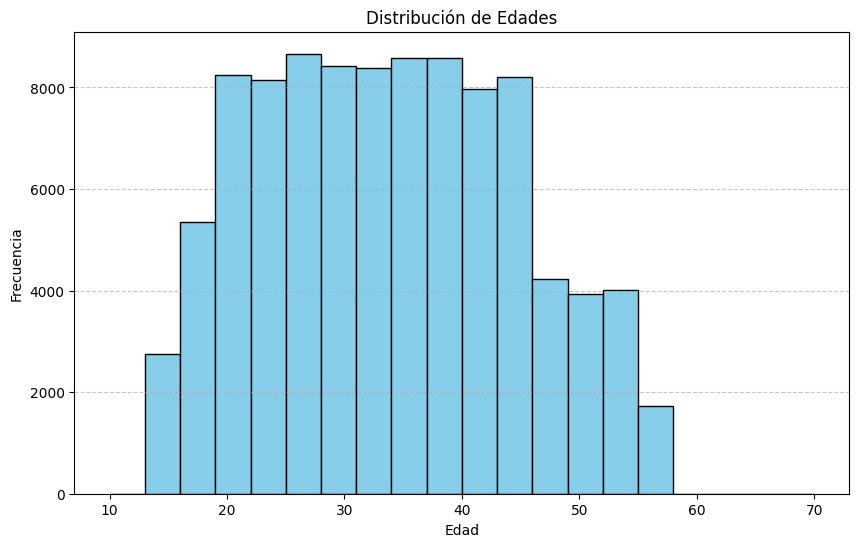

In [46]:
plt.figure(figsize=(10, 6))
plt.hist(df['Age'], bins=20, color='skyblue', edgecolor='black', range=(10,70 ))
plt.title('Distribución de Edades')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

La mayoría de los clientes tienen edades comprendidas entre los 20 y 45 años, lo que indica una concentración significativa de clientes en este rango. A medida que las edades superan los 45 años, la frecuencia de clientes tiende a disminuir gradualmente. Este patrón sugiere que la institución financiera tiene una base de clientes predominantemente joven y de mediana edad, con menos representación de personas mayores.

###¿Qué ocupaciones son las más comunes entre los clientes?


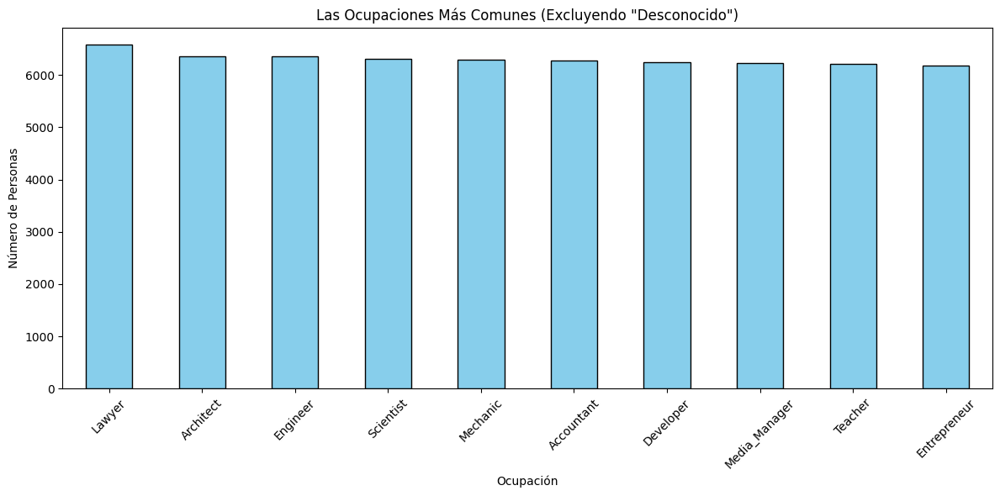

In [47]:
top_occupations = df[df['Occupation'] != 'Desconocido']['Occupation'].value_counts().head(10)

# Crea el gráfico de barras
plt.figure(figsize=(12, 6))
top_occupations.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Las Ocupaciones Más Comunes (Excluyendo "Desconocido")')
plt.xlabel('Ocupación')
plt.ylabel('Número de Personas')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


Según el análisis de las ocupaciones de nuestros clientes, hemos observado que en general, las profesiones presentan una distribución bastante uniforme, con casi la misma cantidad de personas en cada categoría. Sin embargo, las ocupaciones más comunes entre nuestros clientes son "Lawyer," que lidera el ranking, seguida por "Architect," "Engineer," "Scientist," "Mechanic," "Accountant," "Developer," "Media Manager," "Teacher," y "Entrepreneur." Estas son las diez ocupaciones más frecuentes entre nuestros clientes, lo que nos proporciona una visión interesante de la diversidad ocupacional de nuestra base de datos.

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y la cantidad de cuentas bancarias (Num_Bank_Accounts)?

In [48]:
fig = px.box(df,
             x="Credit_Score",
             y="Num_Bank_Accounts",
             color="Credit_Score",
             title="Credit Scores Basado en Numeros de Cuentas de Bancos",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.update_yaxes(range=[0, 10])

fig.show()

Mantener más de cinco cuentas no es bueno para tener un buen Credit Score. Una persona debe tener sólo 2 o 3 cuentas bancarias. Por lo tanto, tener más cuentas bancarias no tiene un impacto positivo en el Credit Score.

###¿Cuál es el comportamiento de pago (Payment_Behaviour) más común entre los clientes?

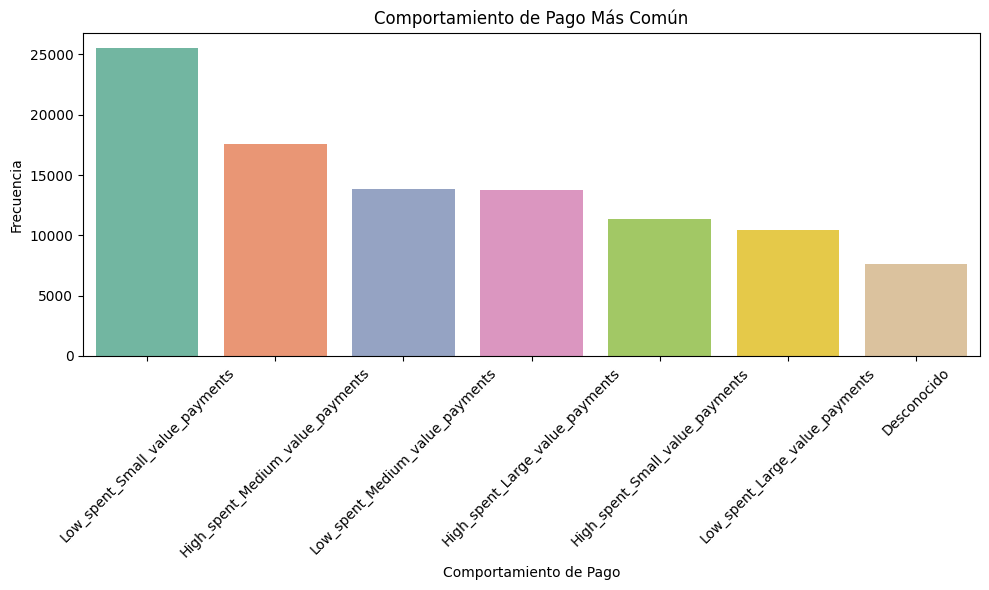

In [49]:
# Calcular la moda del comportamiento de pago
common_payment_behaviour = df['Payment_Behaviour'].mode()[0]

# Contar la frecuencia de cada comportamiento de pago
payment_behaviour_counts = df['Payment_Behaviour'].value_counts()

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x=payment_behaviour_counts.index, y=payment_behaviour_counts.values, palette='Set2')
plt.title('Comportamiento de Pago Más Común')
plt.xlabel('Comportamiento de Pago')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

Basado en el análisis del gráfico, se observa que el comportamiento de pago más utilizado entre los clientes es aquel en el que realizan pagos de bajo valor y gastos pequeños. En segundo lugar, se encuentra el comportamiento en el que hacen pagos de valor medio y tienen gastos más elevados. Estos dos comportamientos parecen ser los más comunes, mientras que los demás comportamientos de pago tienen una menor frecuencia, como se puede apreciar en el gráfico.

###¿Existe alguna correlación entre el puntaje de crédito (Credit_Score) y el saldo mensual (Monthly_Balance)?

In [50]:
fig = px.box(df,
             x="Credit_Score",
             y="Monthly_Inhand_Salary",
             color="Credit_Score",
             title="Credit Scores Basado en Ingreso Mensual",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.update_yaxes(range=[0, 3000])

fig.show()

El saldo mensual no parece ser un factor determinante en la variación de las puntuaciones crediticias de los clientes registrados en el conjunto de datos.

###¿Cuántos clientes tienen retrasos en sus pagos (Num_of_Delayed_Payment)?

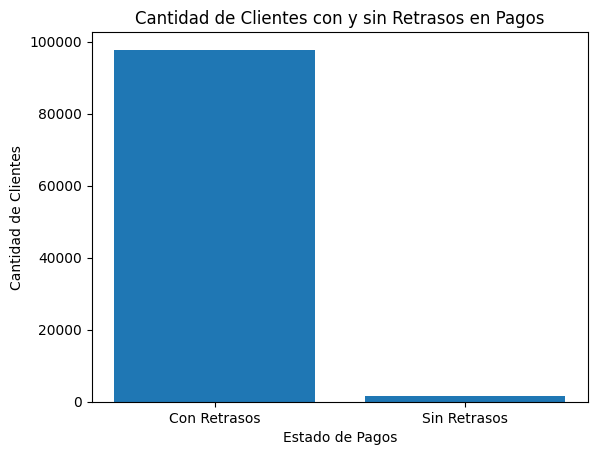

In [51]:
clientes_con_retrasos = df[df['Num_of_Delayed_Payment'] > 0]
cantidad_clientes_con_retrasos = len(clientes_con_retrasos)

clientes_sin_retrasos = df[df['Num_of_Delayed_Payment'] == 0]
cantidad_clientes_sin_retrasos = len(clientes_sin_retrasos)

etiquetas = ['Con Retrasos', 'Sin Retrasos']
cantidad_clientes = [cantidad_clientes_con_retrasos, cantidad_clientes_sin_retrasos]

plt.bar(etiquetas, cantidad_clientes)
plt.xlabel('Estado de Pagos')
plt.ylabel('Cantidad de Clientes')
plt.title('Cantidad de Clientes con y sin Retrasos en Pagos')
plt.show()

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y la cantidad de prestamos solicitados a la vez?

In [52]:
fig = px.box(df,
             x="Credit_Score",
             y="Num_of_Loan",
             color="Credit_Score",
             title="Credit Scores Basado en el Numero de Prestamos",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.update_yaxes(range=[0, 10])

fig.show()

Si mantienes entre 1 y 3 prestamos a la vez lo mas probable es que tengas un buen historial crediticio , ya si mantienes un promedio entre 3 y 5 prestamos solicitados a la vez , lo mas probabe es que tengas un historial creditico estandar, y si solicitas mas de 5 prestamos lo mas probabke es que tengas un historial crediticio pobre.

Para mantener un buen Credit Score, es aconsejable no solicitar más de 1 a 3 préstamos a la vez. Tener más de tres préstamos simultáneos puede tener un impacto negativo en su puntaje crediticio. Este hallazgo sugiere que mantener un equilibrio en la cantidad de préstamos solicitados

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Numero de Dias de Pago Retrasados de la Tarjeta de Credito?

In [53]:
fig = px.box(df,
             x="Credit_Score",
             y="Delay_from_due_date",
             color="Credit_Score",
             title="Credit Scores Basado en el Numero de Dias de Pago Retrasados de la Tarjeta de Credito",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.show()

Por lo tanto, puede retrasar el pago con tarjeta de crédito entre 5 y 14 días desde la fecha de vencimiento. Retrasar sus pagos por más de 18 días a partir de la fecha de vencimiento afectará negativamente su Credit Score.

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Numero de Tarjetas de Credito?

In [54]:
fig = px.box(df,
             x="Credit_Score",
             y="Num_Credit_Card",
             color="Credit_Score",
             title="Credit Scores Basado en el Numero de Tarjetas de Credito",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.update_yaxes(range=[0, 10])

fig.show()

Al igual que la cantidad de cuentas bancarias, tener más tarjetas de crédito no afectará positivamente el Credit Score. Tener de 3 a 5 tarjetas de crédito es bueno para su puntaje crediticio.

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Ingreso Mensual?

In [55]:
fig = px.box(df,
             x="Credit_Score",
             y="Monthly_Inhand_Salary",
             color="Credit_Score",
             title="Credit Scores Basado en Ingreso Mensual",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.update_yaxes(range=[0, 3000])

fig.show()


No hay mucha diferencia en las puntuaciones crediticias de los ingresos mensuales mencionados en los datos.

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y el Average de las Tasas de Interes?

In [56]:
fig = px.box(df,
             x="Credit_Score",
             y="Interest_Rate",
             color="Credit_Score",
             title="Credit Scores Basado en el Average de las Tasas de Interes",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")

fig.update_yaxes(range=[0, 35])

fig.show()

Si la tasa de interés promedio es del 4 al 11%, la calificación crediticia es buena. Tener una tasa de interés promedio de más del 13% es malo para su Credit Score.

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y en lo Invertido Mensual?

In [57]:
fig = px.box(df,
             x="Credit_Score",
             y="Amount_invested_monthly",
             color="Credit_Score",
             title="Credit Scores Basado en lo Invertido Mensual",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")
fig.show()

La cantidad de dinero que invierte mensualmente no afecta mucho su puntaje crediticio.

###¿Cuál es la relación entre el puntaje de crédito (Credit_Score) y en si la persona solo pago el minimo de la tarjeta?

In [58]:
fig = px.box(df,
             x="Credit_Score",
             y="Payment_of_Min_Amount",
             color="Credit_Score",
             title="Credit Scores Basado en el Pago Minimo",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")
fig.show()

Como se puede observar para obtener un buen historial crediticio las personas tienen que pagar mas del minimo, si solo pagan el minimo tiene tendencia a tener un mal historial crediticio.

##Feature Selection

In [59]:
df.describe()

,ID,Customer_ID,Month,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,100000.000000,9.442800e+04,1.000000e+05,1.000000e+05,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,1.000000e+05,1.000000e+05
mean,80631.500000,25982.666640,4.500000,110.649700,5.003688e+08,1.601957e+14,8.040923e+02,17.091280,22.47443,72.466040,3.009960,21.068780,29.738370,4.798589e+14,27.208880,1426.220376,1.150928e+16,-2.999999e+22
std,43301.486619,14340.543051,2.291299,686.244717,2.906500e+08,1.151113e+15,1.187483e+03,117.404834,129.05741,466.422621,62.647879,14.860104,218.017612,4.718339e+15,191.308723,1155.129026,1.251458e+16,3.162151e+24
min,5634.000000,1006.000000,1.000000,-500.000000,8.134900e+04,7.908000e+03,5.330000e-11,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.310000e+16,0.000000,0.230000,0.000000e+00,-3.333333e+26
25%,43132.750000,13664.500000,2.750000,24.000000,2.452217e+08,1.824444e+06,1.776070e-06,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,3.890000e+02,3.000000,566.072500,2.620725e+15,3.211738e+15
50%,80631.500000,25777.000000,4.500000,33.000000,5.003180e+08,3.819725e+06,3.415773e+02,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,8.860000e+02,5.000000,1166.155000,7.683408e+15,6.490306e+15
75%,118130.250000,38385.000000,6.250000,42.000000,7.557849e+08,8.270032e+06,1.152698e+03,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,1.435000e+03,9.000000,1945.962500,1.534842e+16,2.641777e+16
max,155629.000000,50999.000000,8.000000,8698.000000,9.999934e+08,1.349284e+16,8.171360e+03,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,7.970000e+16,2597.000000,4998.070000,6.399602e+16,7.862170e+16


In [60]:
df.var()

<ipython-input-60-28ded241fd7c>:1: FutureWarning:

The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



ID                         1.875019e+09
Customer_ID                2.056512e+08
Month                      5.250053e+00
Age                        4.709318e+05
SSN                        8.447740e+16
Annual_Income              1.325060e+30
Monthly_Inhand_Salary      1.410117e+06
Num_Bank_Accounts          1.378390e+04
Num_Credit_Card            1.665582e+04
Interest_Rate              2.175501e+05
Num_of_Loan                3.924757e+03
Delay_from_due_date        2.208227e+02
Num_of_Delayed_Payment     4.753168e+04
Changed_Credit_Limit       2.226272e+31
Num_Credit_Inquiries       3.659903e+04
Outstanding_Debt           1.334323e+06
Amount_invested_monthly    1.566148e+32
Monthly_Balance            9.999200e+48
dtype: float64

Llevaremos a cabo una matriz de correlación para identificar las variables que presentan las relaciones más fuertes entre sí y así realizar una selección de variables.


<ipython-input-61-6ce77490040b>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



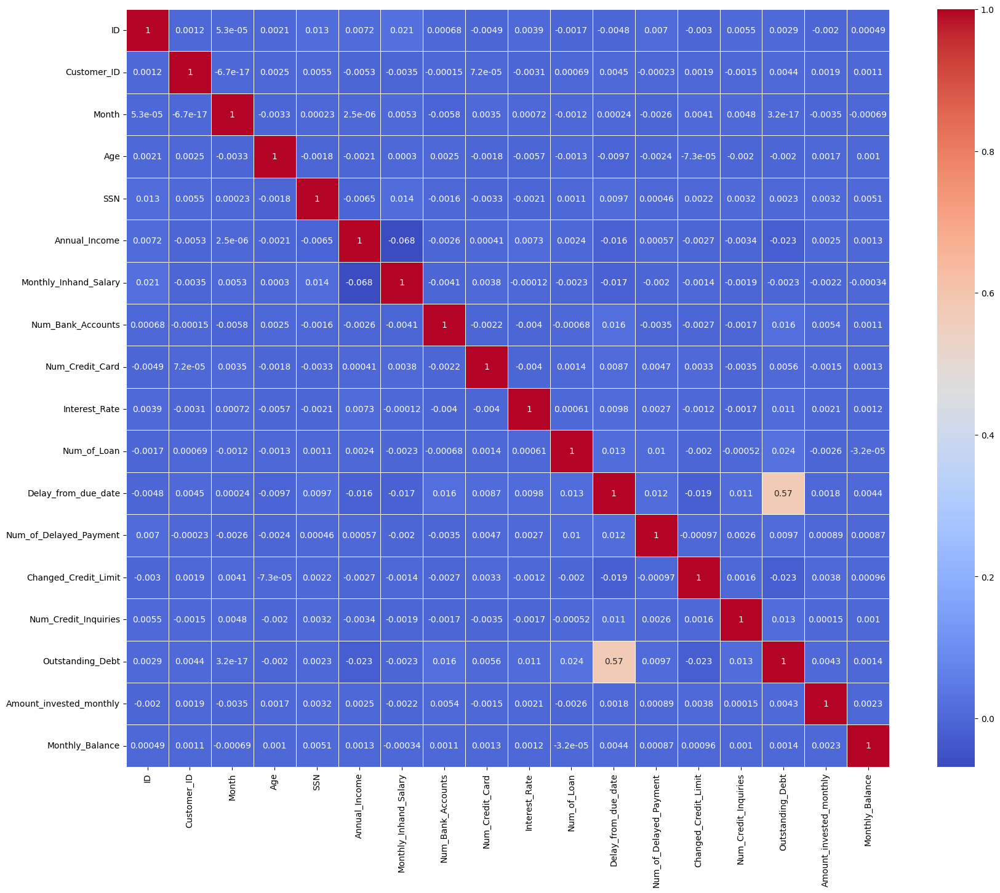

In [61]:
correlation_matrix = df.corr()

plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.show()

Dado que no se observa una correlación clara entre las variables ni ninguna columna con poca variabilidad en la matriz de correlación, es apropiado basar la selección de variables en lo observado en los gráficos y en la comprensión de los factores que más afectan al historial crediticio.

In [62]:
new_df = df
columnas = [ 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Num_of_Loan',
       'Delay_from_due_date','Credit_Mix',
       'Payment_of_Min_Amount',
       'Credit_Score']
new_df = new_df[columnas]

In [63]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Monthly_Inhand_Salary  100000 non-null  float64
 1   Num_Bank_Accounts      100000 non-null  int64  
 2   Num_Credit_Card        100000 non-null  int64  
 3   Num_of_Loan            100000 non-null  int64  
 4   Delay_from_due_date    100000 non-null  int64  
 5   Credit_Mix             99999 non-null   object 
 6   Payment_of_Min_Amount  100000 non-null  object 
 7   Credit_Score           100000 non-null  object 
dtypes: float64(1), int64(4), object(3)
memory usage: 6.1+ MB


Connvertimos las variables categoricas en variables numericas para poderlas usar en nuestro modelo.

In [64]:
new_df["Credit_Mix"] = new_df["Credit_Mix"].map({"Standard": 1, "Desconocido" : -1,
                               "Good": 2,
                               "Bad": 0})
new_df = new_df.dropna(subset=['Credit_Mix'])

<ipython-input-64-e30b022da37e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [65]:
new_df["Payment_of_Min_Amount"] = new_df["Payment_of_Min_Amount"].map({"No": -1,
                               "NM": 0,
                               "Yes": 1})


In [66]:
new_df["Credit_Score"] = new_df["Credit_Score"].map({"Standard": 1,
                               "Good": 2,
                               "Poor": 0})

In [67]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99999 entries, 1 to 99999
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Monthly_Inhand_Salary  99999 non-null  float64
 1   Num_Bank_Accounts      99999 non-null  int64  
 2   Num_Credit_Card        99999 non-null  int64  
 3   Num_of_Loan            99999 non-null  int64  
 4   Delay_from_due_date    99999 non-null  int64  
 5   Credit_Mix             99999 non-null  float64
 6   Payment_of_Min_Amount  99999 non-null  int64  
 7   Credit_Score           99999 non-null  int64  
dtypes: float64(2), int64(6)
memory usage: 6.9 MB


Ahora vamos a hacer el escalado de las variables numericas para un mejor funcionamiento del modelo.

In [68]:
from sklearn.preprocessing import StandardScaler
numerical_columns = [ 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Num_of_Loan',
       'Delay_from_due_date','Credit_Mix',
       'Payment_of_Min_Amount',
       'Credit_Score']

numerical_df = new_df[numerical_columns]
scaler = StandardScaler()
scaled_features = scaler.fit_transform(numerical_df)
scaled_df = pd.DataFrame(scaled_features, columns=numerical_columns)



## Creacion de Modelos

In [69]:
from sklearn.model_selection import train_test_split
x = np.array(new_df[['Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Num_of_Loan',
       'Delay_from_due_date','Credit_Mix',
       'Payment_of_Min_Amount']])
y = np.array(new_df[["Credit_Score"]])

###Random Forest

In [70]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y,
                                                    test_size=0.33,
                                                    random_state=42)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(xtrain, ytrain)

<ipython-input-70-33a7eccef824>:6: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier()

In [71]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

y_pred = model.predict(xtest)
y_true = ytest
accuracy = accuracy_score(ytest, y_pred)

print("Precisión del modelo:", accuracy)


# Calcular la matriz de confusión
confusion = confusion_matrix(y_true, y_pred)

confusion_df = pd.DataFrame(confusion, columns=['Predicted Poor', 'Predicted Standard', 'Predicted Good'],
                            index=['Actual Poor', 'Actual Standard', 'Actual Good'])

print(confusion_df)


Precisión del modelo: 0.7464242424242424
                 Predicted Poor  Predicted Standard  Predicted Good
Actual Poor                7073                2370             175
Actual Standard            2427               13520            1628
Actual Good                 106                1662            4039


### Regresion Logistica

In [72]:
from sklearn.linear_model import LogisticRegression

logistic_regression_model = LogisticRegression()

logistic_regression_model.fit(xtrain, ytrain)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [73]:
from sklearn.metrics import confusion_matrix, accuracy_score

y_pred = logistic_regression_model.predict(xtest)

# Calcular la matriz de confusión
confusion = confusion_matrix(ytest, y_pred)
print("Matriz de Confusión:")
print(confusion)

# Calcular la precisión (accuracy)
accuracy = accuracy_score(ytest, y_pred)
print("Precisión del modelo:", accuracy)


Matriz de Confusión:
[[ 4896  4602   120]
 [ 4816 12160   599]
 [  306  4843   658]]
Precisión del modelo: 0.5367878787878788


###KneighborsClassifier

In [78]:
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5)

knn_model.fit(xtrain, ytrain)


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



KNeighborsClassifier()

In [79]:
y_pred = knn_model.predict(xtest)

# Calcular la matriz de confusión
confusion = confusion_matrix(ytest, y_pred)
print("Matriz de Confusión:")
print(confusion)

# Calcular la precisión (accuracy)
accuracy = accuracy_score(ytest, y_pred)
print("Precisión del modelo:", accuracy)


Matriz de Confusión:
[[ 6682  2787   149]
 [ 2930 13181  1464]
 [  334  2044  3429]]
Precisión del modelo: 0.7058181818181818


###AdaBoosClassifier

In [80]:
from sklearn.ensemble import AdaBoostClassifier

adaboost_model = AdaBoostClassifier(n_estimators=50, random_state=42)

adaboost_model.fit(xtrain, ytrain)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



AdaBoostClassifier(random_state=42)

In [81]:
y_pred = adaboost_model.predict(xtest)

# Calcular la matriz de confusión
confusion = confusion_matrix(ytest, y_pred)
print("Matriz de Confusión:")
print(confusion)

# Calcular la precisión (accuracy)
accuracy = accuracy_score(ytest, y_pred)
print("Precisión del modelo:", accuracy)


Matriz de Confusión:
[[ 4777  4033   808]
 [ 2920 12053  2602]
 [  182  1789  3836]]
Precisión del modelo: 0.6262424242424243


##Conjunto de Entrenamiento y Conjunto de Prueba

In [82]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.33, random_state=42)


In [83]:
# Entrenar el modelo
model.fit(xtrain, ytrain)


<ipython-input-83-e7fba143f6e1>:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier()

In [84]:
from sklearn.metrics import accuracy_score, classification_report
ytrain_pred = model.predict(xtrain)
train_accuracy = accuracy_score(ytrain, ytrain_pred)
train_classification_report = classification_report(ytrain, ytrain_pred)
print("Precisión (Conjunto de Entrenamiento):", train_accuracy)



Precisión (Conjunto de Entrenamiento): 0.9224615292765563


In [85]:
from sklearn.metrics import accuracy_score, classification_report
ytest_pred = model.predict(xtest)
test_accuracy = accuracy_score(ytest, ytest_pred)
test_classification_report = classification_report(ytest, ytest_pred)
print("Precisión (Conjunto de Prueba):", test_accuracy)



Precisión (Conjunto de Prueba): 0.7463636363636363


Como podemos observar , hay una diferencia significativa entre la precisión del conjunto de entrenamiento y el conjunto de prueba, donde el primero exhibe un rendimiento notablemente superior al segundo. Este desequilibrio sugiere claramente la presencia de un caso de sobreajuste en nuestro modelo de aprendizaje automático.

##Insights

Los insights obtenidos de los gráficos revelan que factores como la ocupación, el ingreso mensual y la cantidad de inversiones mensuales no parecen tener un impacto significativo en el puntaje crediticio. Sin embargo, se observa una correlación positiva entre el puntaje crediticio y la posesión de un menor número de cuentas bancarias, tarjetas de crédito y préstamos simultáneos. También, se observa que aquellos individuos que optan por no limitarse a pagar únicamente el monto mínimo de sus tarjetas de crédito tienden a disfrutar de un puntaje crediticio favorable. Por otro lado, el retraso en los pagos y la acumulación de deudas elevadas ejercen un efecto negativo en el puntaje crediticio, lo que sugiere que el historial crediticio es un factor crítico en la determinación de la salud crediticia.



Desarrollamos cuatro modelos distintos para predecir el puntaje crediticio, y los resultados más prometedores se obtuvieron en el modelo Random Forest, alcanzando una precisión cercana al 75%. El siguiente modelo más exitoso fue el K-Nearest Neighbors Classifier, con una precisión del 70%. En contraste, los otros dos modelos, Regresión Logística y AdaBoost Classifier, arrojaron precisiones del 54% y 60%, respectivamente. Además, al comparar el rendimiento entre los conjuntos de entrenamiento y prueba, se reveló que el conjunto de entrenamiento exhibe un desempeño superior al conjunto de prueba, lo que indica la presencia de un caso de sobreajuste en nuestro modelo.